# Medical Image Denoising Using Generative Adversarial Netowrk

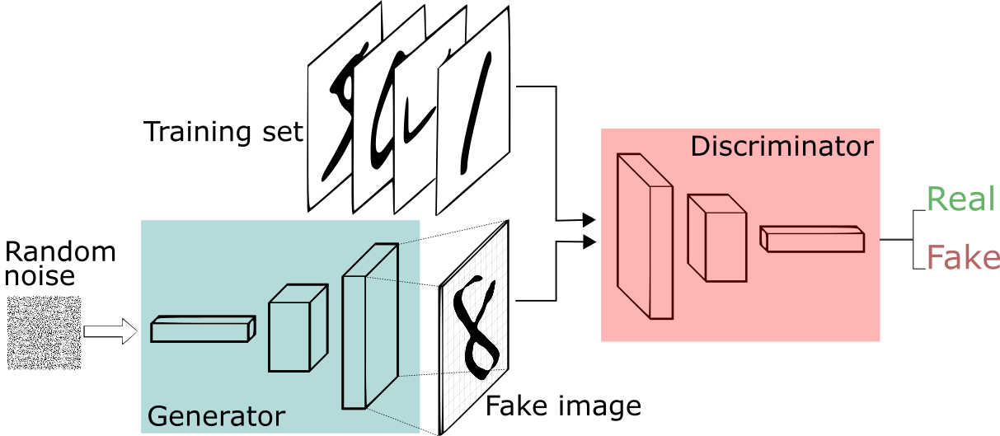

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install torchsummary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch 
torch.manual_seed(42)
import numpy as np 
import matplotlib.pyplot as plt 
from google.colab import files
import pandas as pd

# Import the Images module from pillow

from PIL import Image
import numpy as np
import skimage
import os
from tqdm.notebook import tqdm

from torch import nn
from torchsummary import summary
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision import transforms 
from torch.nn.modules.activation import LeakyReLU
from torchvision.transforms import InterpolationMode

from torchmetrics import PeakSignalNoiseRatio
from torchmetrics import StructuralSimilarityIndexMeasure
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Configurations

In [ ]:
# device = 'cuda' # used to transer images to device --> image = image.to(device)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

batch_size = 10

# opt parmas
lr = 0.0002 
beta_1 = 0.5
beta_2 = 0.5

#train vars
epochs = 50

size = 128, 128
img_dir = '/content/drive/MyDrive/Denoising_GANs/data/'
im1 = Image.open('/content/drive/MyDrive/Denoising_GANs/data/00000001_000.png')


In [ ]:
def reduce_size(image):
  im_resized = image.resize(size, Image.LANCZOS)
  return np.array(im_resized).reshape(1,*size)/255

In [ ]:
import numpy as np
import os
import cv2
def noisy(noise_typ,image):
  if noise_typ == "gauss":
      row,col,ch= image.shape
      mean = 0
      var = 0.1
      sigma = var**1.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy
  elif noise_typ == "poisson":
      vals = len(np.unique(image))
      vals = 2 ** np.ceil(np.log2(vals))
      noisy = np.random.poisson(image * vals) / float(vals)
      return noisy
  elif noise_typ =="speckle":
      row,col,ch = image.shape
      gauss = np.random.randn(row,col,ch)
      gauss = gauss.reshape(row,col,ch)        
      noisy = image + image * gauss/10
      return noisy

In [ ]:
import random
im1 = Image.open('/content/drive/MyDrive/Denoising_GANs/data/00000001_000.png')
im1 = reduce_size(im1)
im1.min(   )
noi = ["gauss","poisson","speckle"]
random_noise = random.choice(noi)
print(random_noise)
im1 = noisy(random_noise, im1)

poisson


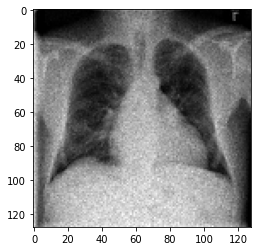

In [ ]:
plt.imshow(im1[0], cmap="gray")

In [ ]:
def create_training_data(img_dir):
  real_images = []
  noisy_images = []
  for f in tqdm(os.listdir(img_dir)):
    if os.path.splitext(f)[1] not in ['.png', '.jpg', '.jpeg']:
      continue
    image = Image.open(img_dir + str(f))
    image = reduce_size(image)
    if len(image.shape)>3:
      continue
    real_images.append(image)
    noi = ["poisson", "speckle","gauss"]
    random_noise = random.choice(noi)
    noisy_image = noisy(random_noise,image)
    #  = image + 0.05 * np.random.randn(*image.shape)
    noisy_images.append(noisy_image)
  return torch.tensor(real_images).double(), torch.tensor(noisy_images).double()


In [ ]:
real_images, noisy_images = create_training_data(img_dir)

  0%|          | 0/200 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)


In [ ]:
# Stacking the real and noisy images
a = torch.stack((real_images,noisy_images), axis=1)
a.shape

torch.Size([200, 2, 1, 128, 128])

# Load Dataset Into Batches 

In [ ]:
# Loading Real Images
real_image_loader = DataLoader(real_images, batch_size=batch_size, shuffle = True)

In [ ]:
# Loading the stacked Images
a_loader = DataLoader(a, batch_size=batch_size, shuffle = True)

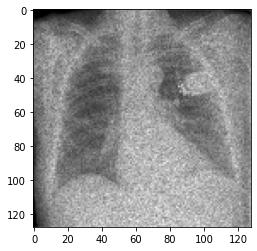

In [ ]:
# Printing noisy image
plt.imshow(noisy_images[0][0], cmap="gray")

In [ ]:
# Loading noisy Images
noisy_image_loader = DataLoader(noisy_images, batch_size=batch_size, shuffle = True)

In [ ]:
# Creating Batches of real and noisy Images
# Batch0 is Real Image
# Batch1 is fake Image

dataiter = iter(a_loader)

batch = dataiter.next()

batch0 = batch[:,0].to(device)
batch1 = batch[:,1].to(device)

In [ ]:
# Checking batch size
batch0.shape

torch.Size([10, 1, 128, 128])

In [ ]:
# This function used to plot some of images from the batch

def show_tensor_images(tensor_img, num_images = 9, size=(1, 128, 128)):
    unflat_img = tensor_img.detach().cpu()
    img_grid = make_grid(unflat_img[:num_images], nrow=3)
    plt.figure(figsize=(10,10))
    plt.imshow(img_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
# Functions defining Evaluation Metrics

def calculate_batch_psnr(fake_image,real_image):
    psnr = PeakSignalNoiseRatio().to(device)
    p = psnr(fake_image, real_image)
    return p

def calculate_batch_ssim(fake_image, real_image):
    ssim = StructuralSimilarityIndexMeasure().to(device)
    s = ssim(fake_image, real_image)
    return s

In [ ]:
# Testing PSNR
ps = calculate_batch_psnr(batch1, batch0)
ps

tensor(26.1009, device='cuda:0', dtype=torch.float64)

In [ ]:
# Testing SSIM
ss = calculate_batch_ssim(batch1, batch0)
ss

tensor(0.6151, device='cuda:0')

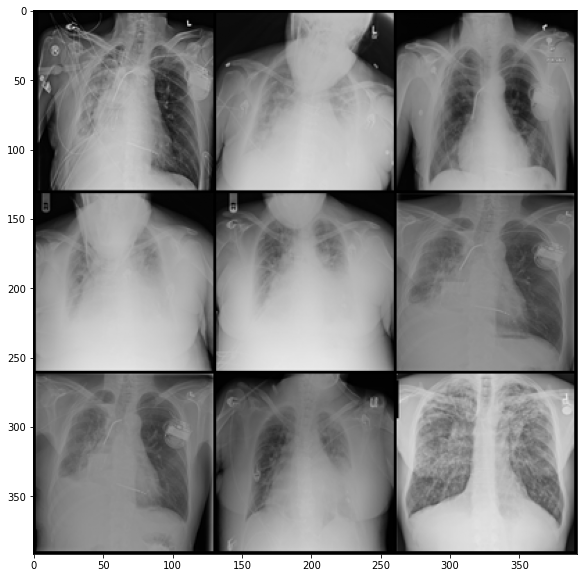

In [ ]:
# Plotting Real Images
show_tensor_images(batch0)

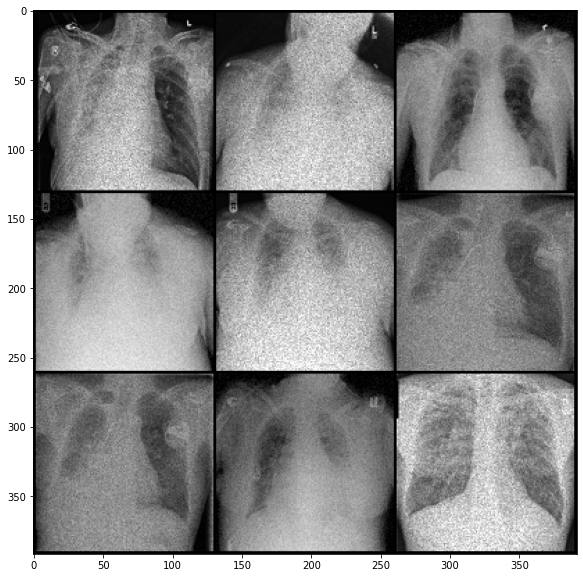

In [ ]:
# PLotting Noisy Images
show_tensor_images(batch1)

# Create Discriminator Network 

In [ ]:
# Defining the Discriminator Block

def get_disc_block(in_channels, out_channels, kernel_size, stride, padding=0):
  model = nn.Sequential(
      # Convolution Layer
      nn.Conv2d( in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, stride = stride, padding=padding),
      # Batch Normalization
      nn.BatchNorm2d(out_channels),
      # LeakyReLU activation function
      nn.LeakyReLU()
  )
  return model

In [ ]:
# Defining the class for Discriminator Model

class Discriminator(nn.Module):

  def __init__(self):
    super(Discriminator, self).__init__()

    self.initial = get_disc_block(1,16,(3,3),2)
    self.block1 = get_disc_block(1,16,(3,3),2)
    self.block2 = get_disc_block(16,32,(5,5),2)
    self.block3 = get_disc_block(32,64,(5,5),2)
    self.block4 = get_disc_block(64,128,(5,5),2)
    self.block5 = get_disc_block(128,256,(5,5),2)
    self.flatten = nn.Flatten()
    self.linear = nn.Linear(in_features=256, out_features=1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, images):
    output = self.initial(images)
    output = self.block2(output)
    output = self.block3(output)
    output = self.block4(output)
    output = self.block5(output)
    output = self.linear(self.flatten(output))
    # Sigmoid Activation at Last to classify between real and fake
    output = self.sigmoid(output)
    return output

In [ ]:
# Defining the instance of the model
D = Discriminator()
D.to(device)

Discriminator(
  (initial): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, m

In [ ]:
# Checking the summary of the model
summary(D, input_size=(1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 63, 63]             160
       BatchNorm2d-2           [-1, 16, 63, 63]              32
         LeakyReLU-3           [-1, 16, 63, 63]               0
            Conv2d-4           [-1, 32, 30, 30]          12,832
       BatchNorm2d-5           [-1, 32, 30, 30]              64
         LeakyReLU-6           [-1, 32, 30, 30]               0
            Conv2d-7           [-1, 64, 13, 13]          51,264
       BatchNorm2d-8           [-1, 64, 13, 13]             128
         LeakyReLU-9           [-1, 64, 13, 13]               0
           Conv2d-10            [-1, 128, 5, 5]         204,928
      BatchNorm2d-11            [-1, 128, 5, 5]             256
        LeakyReLU-12            [-1, 128, 5, 5]               0
           Conv2d-13            [-1, 256, 1, 1]         819,456
      BatchNorm2d-14            [-1, 25

In [ ]:
D.double()

Discriminator(
  (initial): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, m

# Create Generator Network 

In [ ]:
# Defining the Generator Block
def get_gen_blockConv(in_channels, out_channels, kernel_size, stride, padding=0):
  model = nn.Sequential(
      # Convolution Layer
      nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
      # Batch Normalization
      nn.BatchNorm2d(out_channels),
      # PReLU Activation function
      nn.PReLU()
  )
  return model

In [ ]:
# Defining the class of Generator Model

class Generator(nn.Module):

  def __init__(self):
    super(Generator, self).__init__()

    self.block1 = get_gen_blockConv(1, 16, (9,9), 1, padding='same')
    self.block2 = get_gen_blockConv(16, 32, (3,3), 1, padding='same')
    self.block3 = get_gen_blockConv(32, 64, (3,3), 1, padding='same')
    self.block4 = get_gen_blockConv(64, 128, (3,3), 1, padding='same')
    self.blockResConv = get_gen_blockConv(128, 128, (3,3), 1, padding='same')
    self.block5= get_gen_blockConv(128, 64, (3,3), 1, padding='same' )
    self.block6 = get_gen_blockConv(64, 32, (3,3), 1, padding='same' )
    self.block7 = get_gen_blockConv(32, 16, (3,3), 1, padding='same' )
    self.lastconv = get_gen_blockConv(16, 1, (9,9), 1, padding='same' )
    self.tanh = nn.Tanh()
    self.prelu = nn.PReLU()

  def resnet_forward(self, input):
    output = self.blockResConv(input)

    output = output + input
    output = self.prelu(output)
    return output

  def forward(self,noisy_image):
    # Down sampling
    conv1 = self.block1(noisy_image)
    conv2 = self.block2(conv1)
    conv3 = self.block3(conv2)
    conv4 = self.block4(conv3)

    # ResNet Function
    res1 = self.resnet_forward(conv4)
    res2 = self.resnet_forward(res1)
    res3 = self.resnet_forward(res2)

    # Up sampling
    T0 = transforms.Resize((32, 32), InterpolationMode.NEAREST)
    deconv0 = self.block5(T0(res3))
    T1 = transforms.Resize((64, 64), InterpolationMode.NEAREST)
    deconv1 = self.block6(T1(deconv0))
    T2 = transforms.Resize((128, 128), InterpolationMode.NEAREST)
    deconv2 = self.block7(T2(deconv1))
    deconv2 = deconv2 + conv1
    conv5 = self.lastconv(deconv2)
    conv5= self.tanh(conv5)
    output = conv5 + noisy_image

    return output

In [ ]:
# Defining the instance of Generator
G = Generator()
G.to(device)

Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
summary(G, input_size=(1,128,128) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,312
       BatchNorm2d-2         [-1, 16, 128, 128]              32
             PReLU-3         [-1, 16, 128, 128]               1
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
             PReLU-6         [-1, 32, 128, 128]               1
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
             PReLU-9         [-1, 64, 128, 128]               1
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
            PReLU-12        [-1, 128, 128, 128]               1
           Conv2d-13        [-1, 128, 128, 128]         147,584
      BatchNorm2d-14        [-1, 128, 1

In [ ]:
G.double()

Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
# Replace Random initialized weights to Normal weights  

def weights_init(m):  
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.normal_(m.weight, -0.01, 0.01)
    if isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight, -0.01, 0.01)
        nn.init.constant_(m.bias, 0)

In [ ]:
# Applying weigths
D = D.apply(weights_init)
G = G.apply(weights_init)

In [ ]:
g_out = G(batch1)

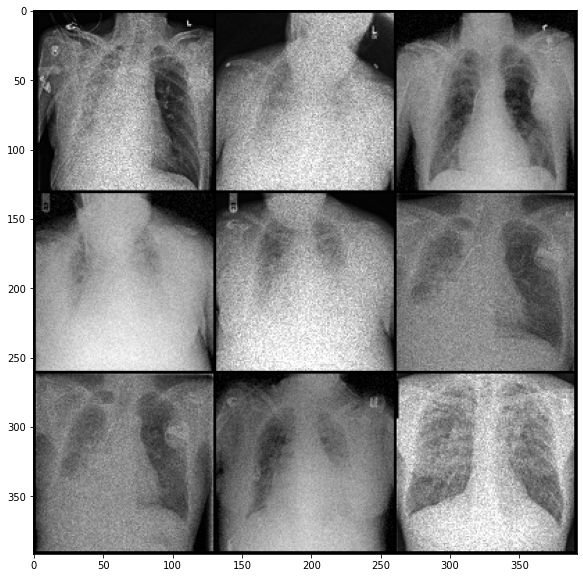

In [ ]:
show_tensor_images(g_out)

# Create Loss Function and Load Optimizer

In [ ]:
# Defining the loss

def real_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  y_true = torch.ones_like(disc_pred)
  loss = criterion(disc_pred, y_true)
  return loss

def fake_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  y_true = torch.zeros_like(disc_pred)
  loss = criterion(disc_pred, y_true)
  return loss

def pixel_loss(true_img, gen_img):
    l2_loss = nn.MSELoss(reduction = 'sum')
    return l2_loss(true_img, gen_img)


In [ ]:
# Defining the Adam optimizer
D_opt = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta_1, beta_2))
G_opt = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta_1, beta_2))

In [ ]:
# Initializing loss
loss = nn.BCEWithLogitsLoss()
input = torch.randn(3, requires_grad=True)
target = torch.empty(3).random_(2)
output = loss(input, target)
output.backward()

In [ ]:
output

tensor(0.5854, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)

# Training Loop 

In [ ]:
# Defining List of items to be stored

iter=[]
psnr=[]
dloss=[]
gloss=[]
ssim = []

iter_psnr = pd.DataFrame(columns=["Iterations", "PSNR", "SSIM","D_Loss", "G_Loss"])

Epoch Number: 1


  0%|          | 0/20 [00:00<?, ?it/s]

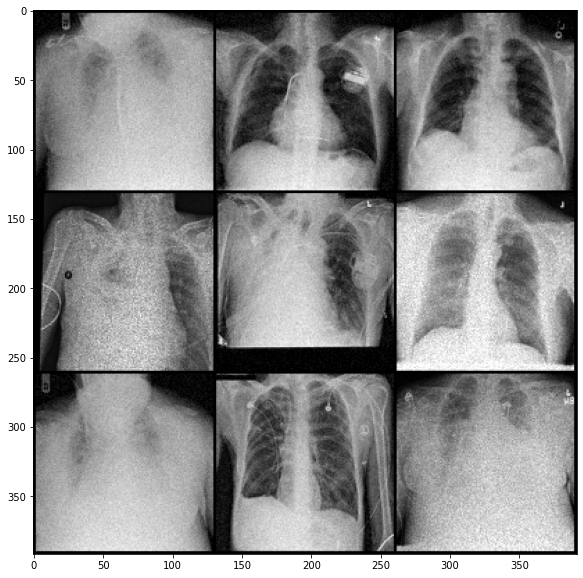

avg_d_loss 0.7203643515876943
avg_g_loss 3.864588019783741
PSNR:  28.1300340648761
SSIM:  0.7242306470870972


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 2


  0%|          | 0/20 [00:00<?, ?it/s]

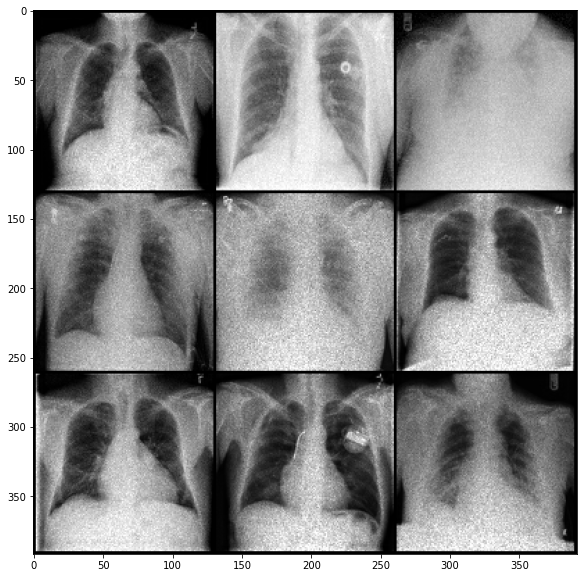

avg_d_loss 0.71921354232701
avg_g_loss 3.504124138225707
PSNR:  27.576759828327795
SSIM:  0.7105477452278137


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 3


  0%|          | 0/20 [00:00<?, ?it/s]

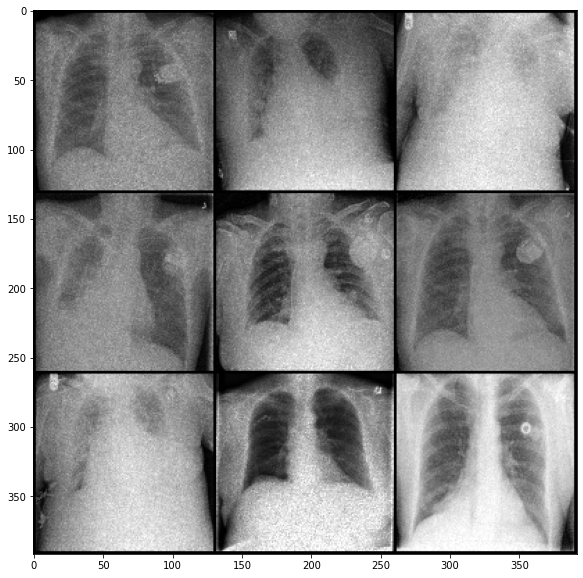

avg_d_loss 0.7179616197623185
avg_g_loss 3.146607141581382
PSNR:  28.226286374240317
SSIM:  0.6871315836906433


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 4


  0%|          | 0/20 [00:00<?, ?it/s]

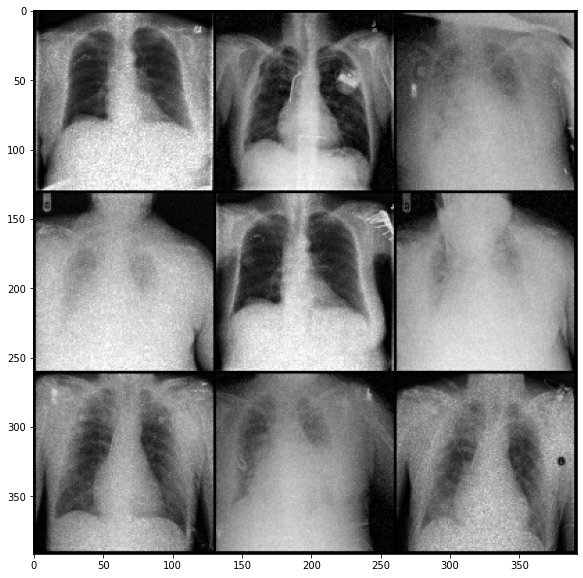

avg_d_loss 0.7165753716466176
avg_g_loss 2.8936277520432365
PSNR:  29.03392026573556
SSIM:  0.7629603743553162


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 5


  0%|          | 0/20 [00:00<?, ?it/s]

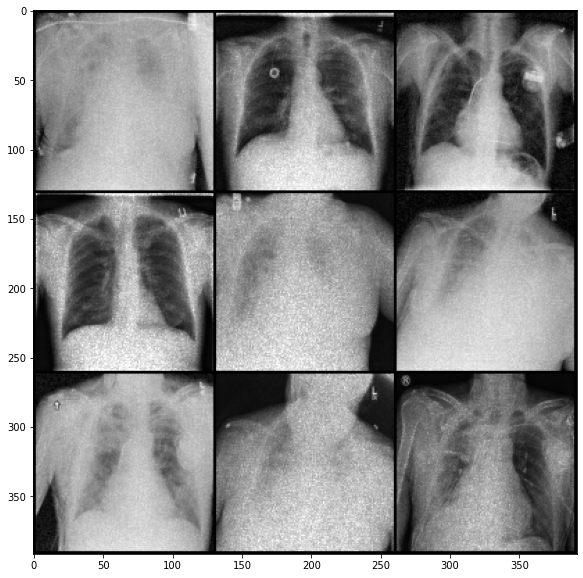

avg_d_loss 0.7151314860839406
avg_g_loss 2.70364004952883
PSNR:  29.131798213836646
SSIM:  0.7680195569992065


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 6


  0%|          | 0/20 [00:00<?, ?it/s]

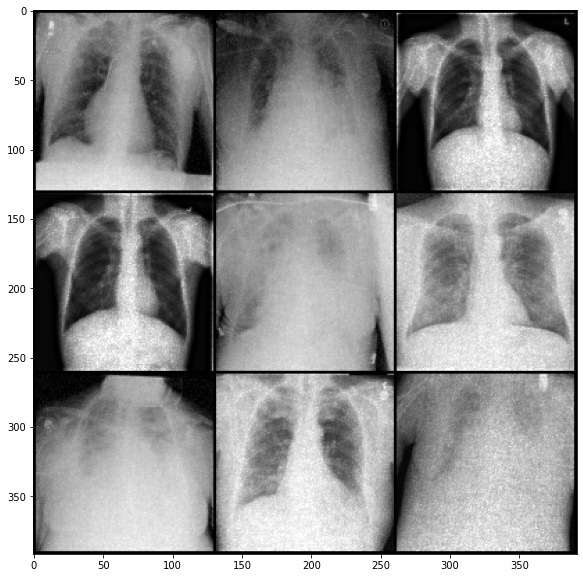

avg_d_loss 0.7136806859755136
avg_g_loss 2.5647762271050465
PSNR:  29.315244163359743
SSIM:  0.7946970462799072


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 7


  0%|          | 0/20 [00:00<?, ?it/s]

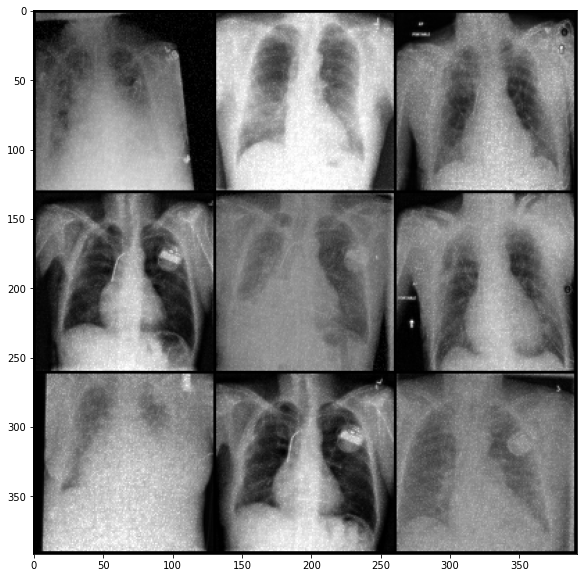

avg_d_loss 0.7121397170774484
avg_g_loss 2.390228979797113
PSNR:  30.025311389940725
SSIM:  0.7896158695220947


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 8


  0%|          | 0/20 [00:00<?, ?it/s]

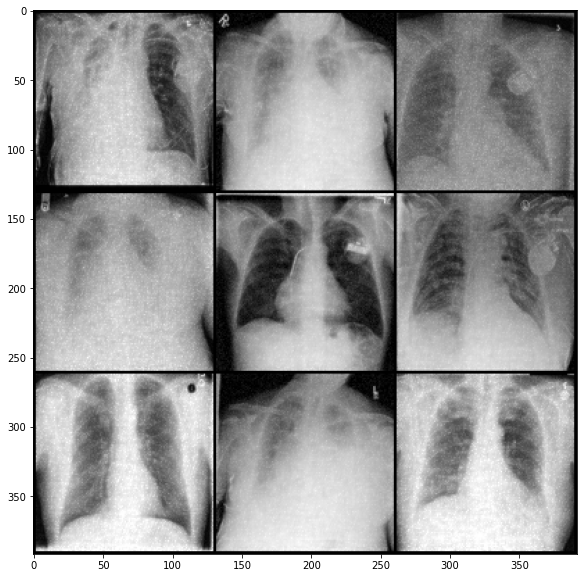

avg_d_loss 0.7105999234720829
avg_g_loss 2.278416172460411
PSNR:  30.447473852346
SSIM:  0.8228165507316589


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 9


  0%|          | 0/20 [00:00<?, ?it/s]

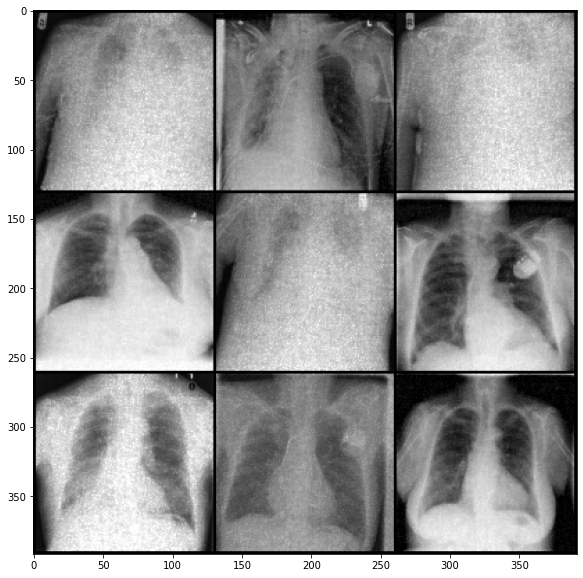

avg_d_loss 0.7088839564417458
avg_g_loss 2.1497503107054747
PSNR:  29.24109189809332
SSIM:  0.7538888454437256


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 10


  0%|          | 0/20 [00:00<?, ?it/s]

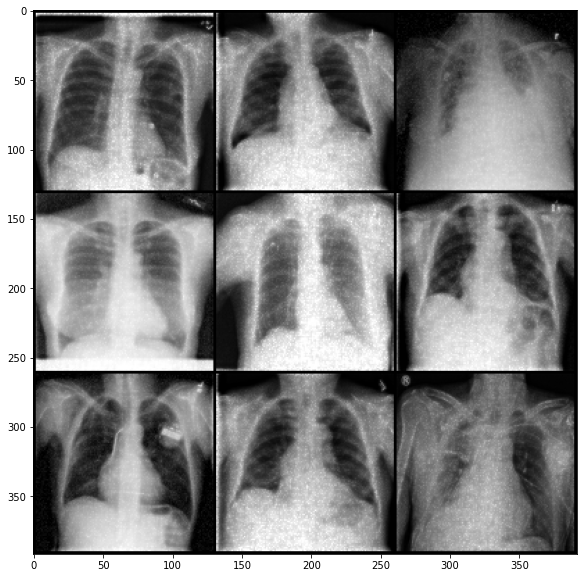

avg_d_loss 0.7074180201957752
avg_g_loss 2.050126373409273
PSNR:  30.126129597930593
SSIM:  0.8560303449630737


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 11


  0%|          | 0/20 [00:00<?, ?it/s]

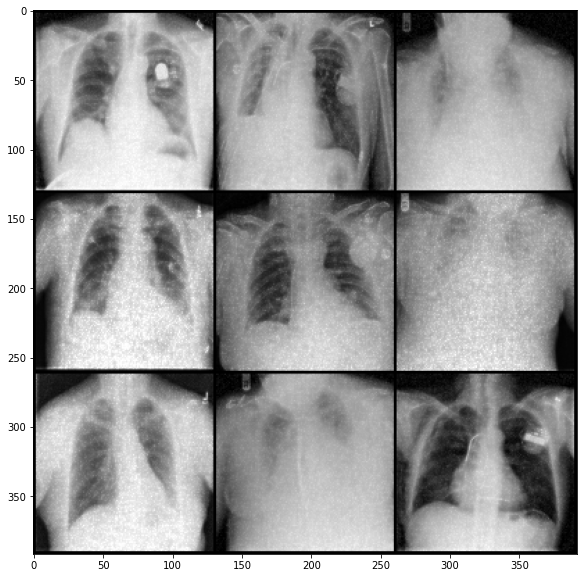

avg_d_loss 0.7060803456483666
avg_g_loss 1.9734584445527534
PSNR:  30.813663342227073
SSIM:  0.8211897015571594


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 12


  0%|          | 0/20 [00:00<?, ?it/s]

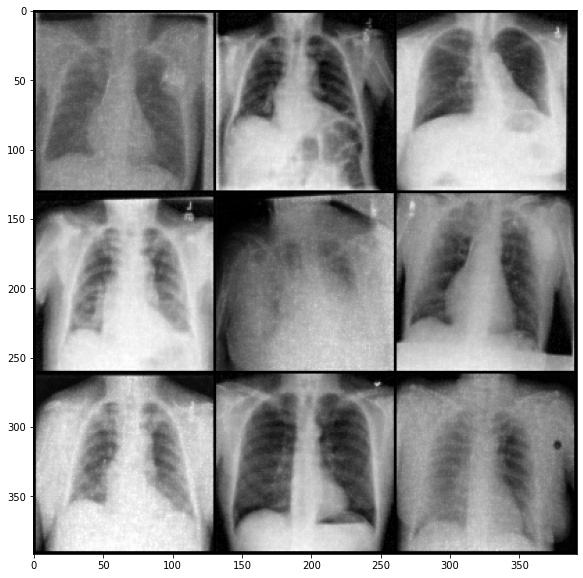

avg_d_loss 0.704496405342691
avg_g_loss 1.8844399406324908
PSNR:  32.064436854238295
SSIM:  0.8790048360824585


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 13


  0%|          | 0/20 [00:00<?, ?it/s]

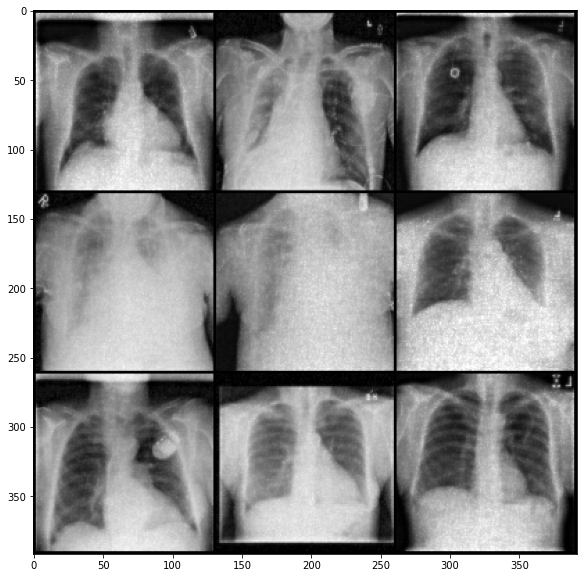

avg_d_loss 0.7030096498282428
avg_g_loss 1.8254674458817253
PSNR:  31.07583848837521
SSIM:  0.8561403155326843


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 14


  0%|          | 0/20 [00:00<?, ?it/s]

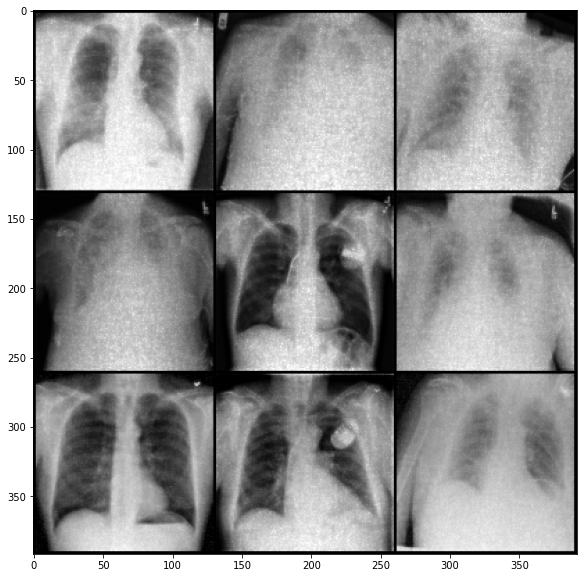

avg_d_loss 0.7016499941926383
avg_g_loss 1.7836729952583497
PSNR:  30.807487985904345
SSIM:  0.8052204251289368


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 15


  0%|          | 0/20 [00:00<?, ?it/s]

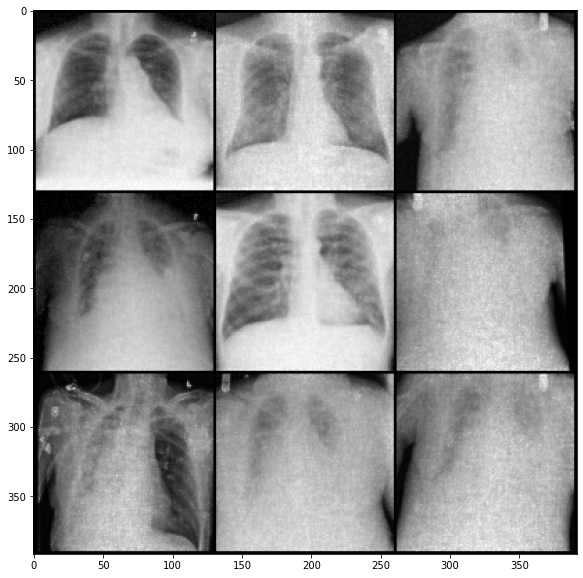

avg_d_loss 0.7004817086266769
avg_g_loss 1.7425671933751352
PSNR:  31.276495140521266
SSIM:  0.7943260073661804


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 16


  0%|          | 0/20 [00:00<?, ?it/s]

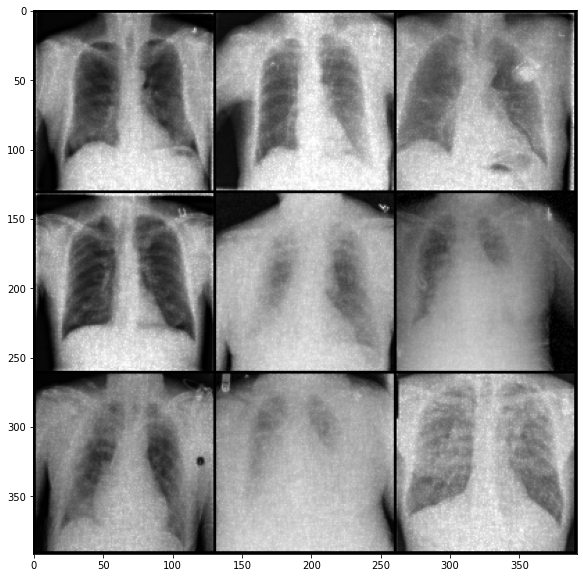

avg_d_loss 0.6992536995688245
avg_g_loss 1.712687560803552
PSNR:  30.468824984028515
SSIM:  0.8193000555038452


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 17


  0%|          | 0/20 [00:00<?, ?it/s]

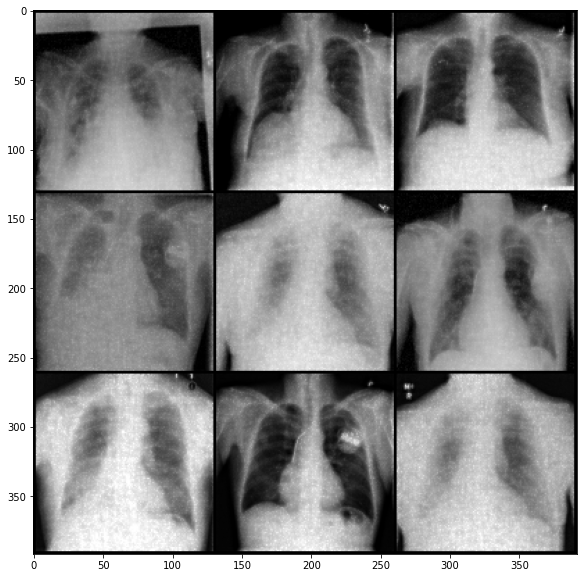

avg_d_loss 0.6981862181929847
avg_g_loss 1.6969841475038863
PSNR:  31.456789661415826
SSIM:  0.8460196256637573


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 18


  0%|          | 0/20 [00:00<?, ?it/s]

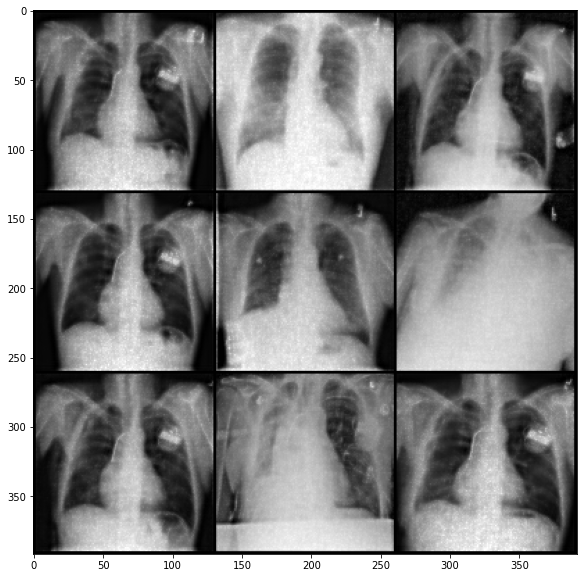

avg_d_loss 0.6974085290284682
avg_g_loss 1.7046197118789208
PSNR:  31.92731492470898
SSIM:  0.8823145031929016


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 19


  0%|          | 0/20 [00:00<?, ?it/s]

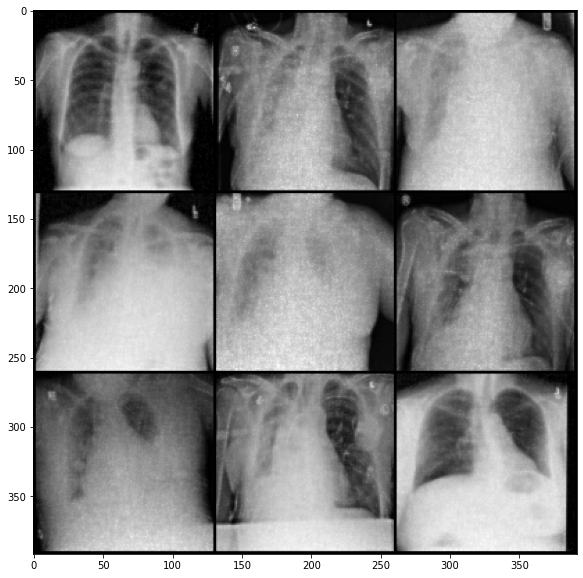

avg_d_loss 0.6965348167614869
avg_g_loss 1.684240033394832
PSNR:  31.720138616051493
SSIM:  0.8351669311523438


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 20


  0%|          | 0/20 [00:00<?, ?it/s]

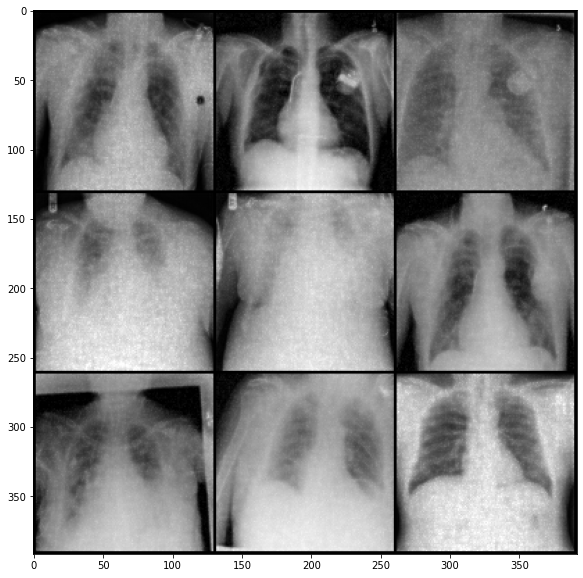

avg_d_loss 0.6958654084459002
avg_g_loss 1.6750306291729438
PSNR:  32.00988989924786
SSIM:  0.8500632047653198


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 21


  0%|          | 0/20 [00:00<?, ?it/s]

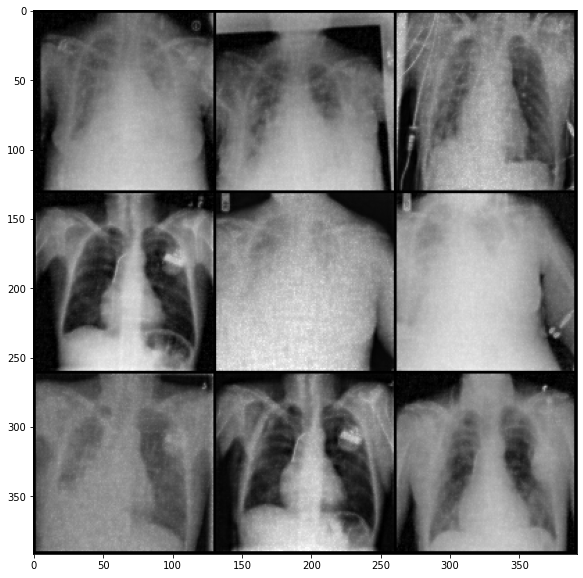

avg_d_loss 0.6952364642784556
avg_g_loss 1.6839063940712393
PSNR:  32.135441590749274
SSIM:  0.8496831059455872


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 22


  0%|          | 0/20 [00:00<?, ?it/s]

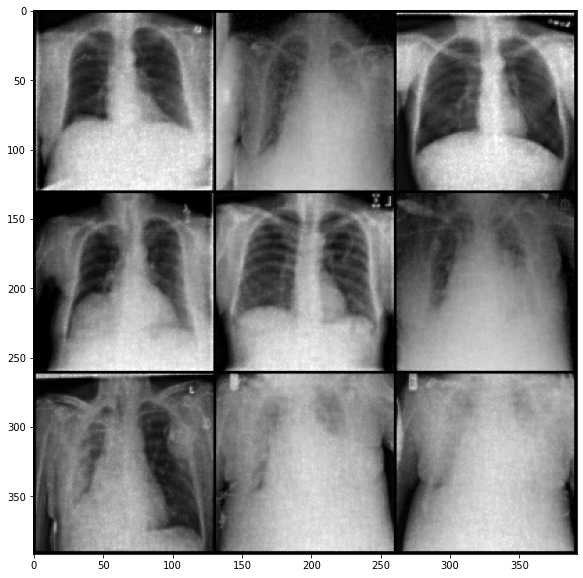

avg_d_loss 0.694926134728713
avg_g_loss 1.6626531091975874
PSNR:  32.23228268086814
SSIM:  0.8710323572158813


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 23


  0%|          | 0/20 [00:00<?, ?it/s]

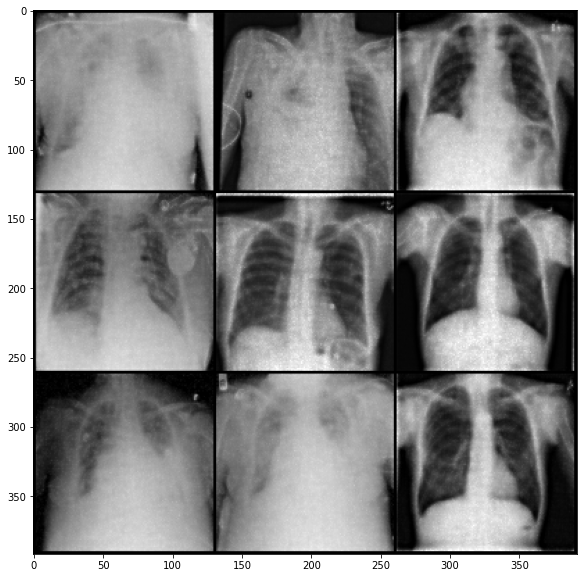

avg_d_loss 0.6945499552834176
avg_g_loss 1.6671043817254074
PSNR:  32.61507362268062
SSIM:  0.8844705820083618


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 24


  0%|          | 0/20 [00:00<?, ?it/s]

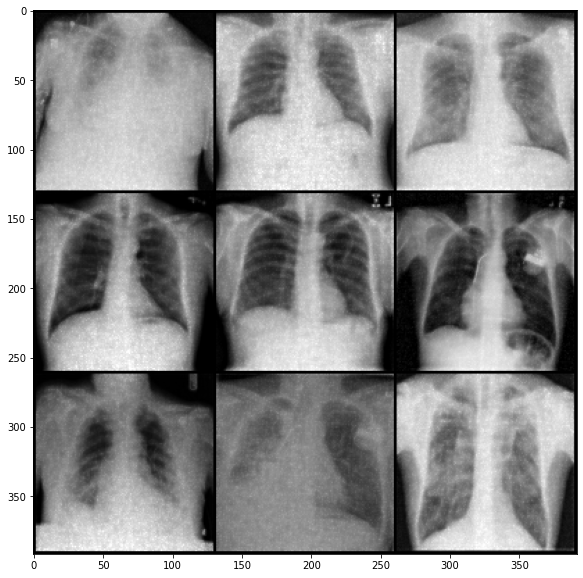

avg_d_loss 0.6941391067030582
avg_g_loss 1.6535239842693392
PSNR:  31.927145112764492
SSIM:  0.8492871522903442


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 25


  0%|          | 0/20 [00:00<?, ?it/s]

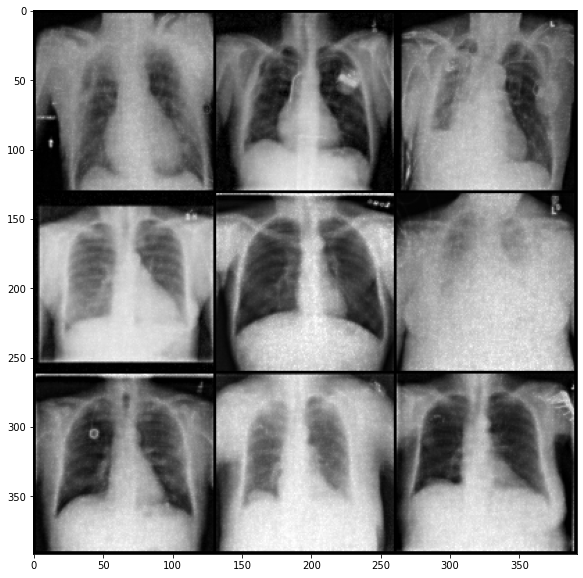

avg_d_loss 0.693749001373696
avg_g_loss 1.6349935484839953
PSNR:  32.061611322270664
SSIM:  0.8805873990058899


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 26


  0%|          | 0/20 [00:00<?, ?it/s]

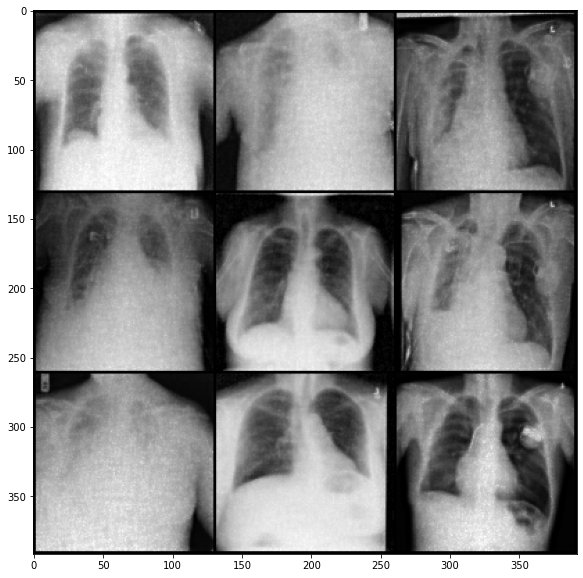

avg_d_loss 0.6937466418228426
avg_g_loss 1.6395356850414124
PSNR:  32.163541482699515
SSIM:  0.8505839109420776


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 27


  0%|          | 0/20 [00:00<?, ?it/s]

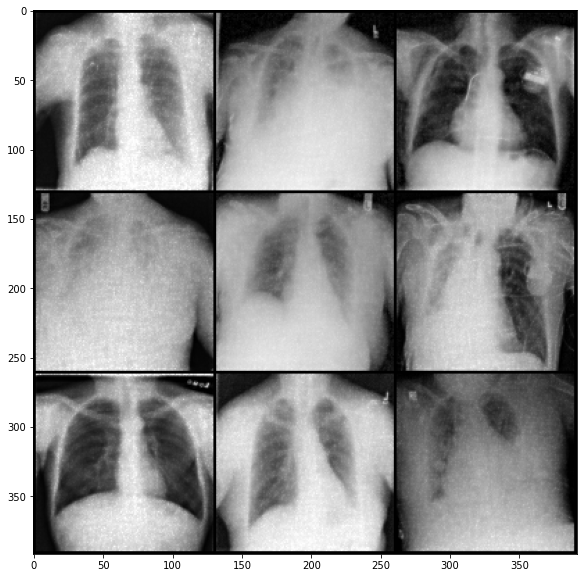

avg_d_loss 0.6936441451896499
avg_g_loss 1.6420105348915743
PSNR:  32.24626524488258
SSIM:  0.8758990168571472


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 28


  0%|          | 0/20 [00:00<?, ?it/s]

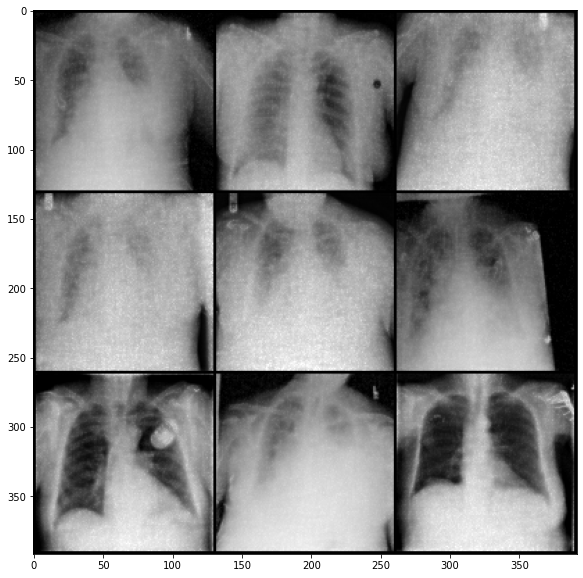

avg_d_loss 0.6932867797923745
avg_g_loss 1.6110234089168334
PSNR:  32.52037278644707
SSIM:  0.8470882177352905


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 29


  0%|          | 0/20 [00:00<?, ?it/s]

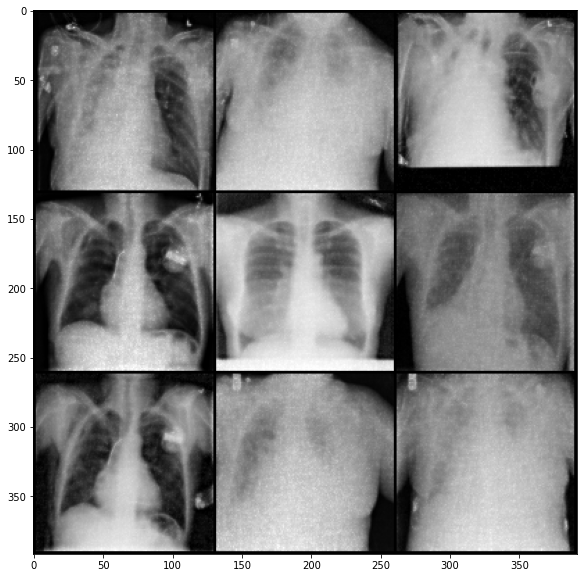

avg_d_loss 0.6931255132382004
avg_g_loss 1.6088385465605692
PSNR:  32.28922251428816
SSIM:  0.8647977113723755


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 30


  0%|          | 0/20 [00:00<?, ?it/s]

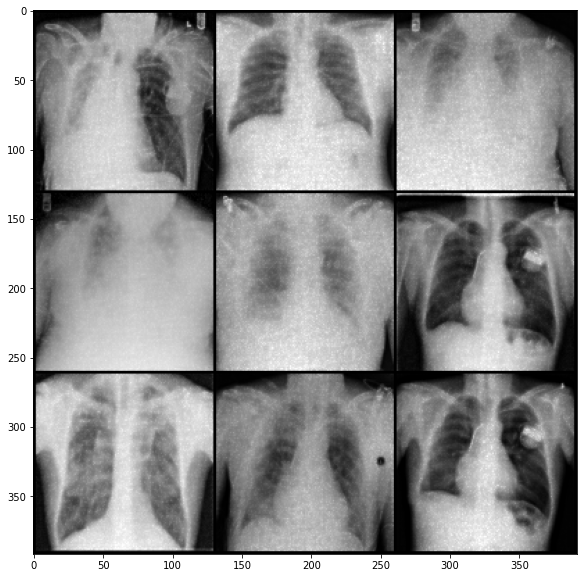

avg_d_loss 0.6930117394596469
avg_g_loss 1.6032776445285666
PSNR:  31.636868160680933
SSIM:  0.8331884145736694


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 31


  0%|          | 0/20 [00:00<?, ?it/s]

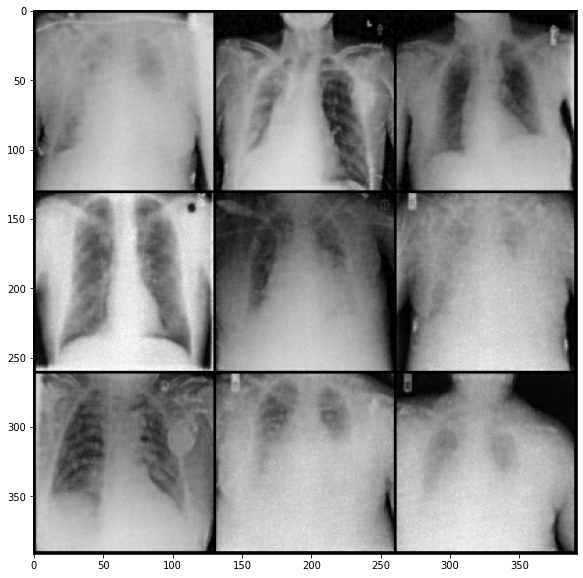

avg_d_loss 0.6926087166783852
avg_g_loss 1.5879368698826841
PSNR:  32.942189303621575
SSIM:  0.8670886158943176


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 32


  0%|          | 0/20 [00:00<?, ?it/s]

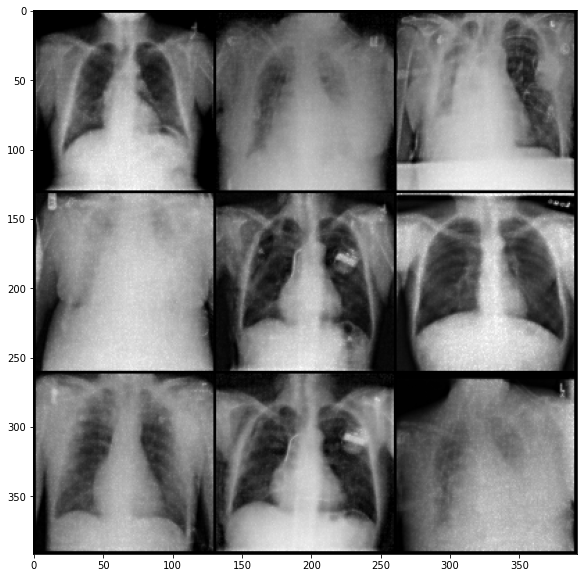

avg_d_loss 0.692431572135302
avg_g_loss 1.5820708750745731
PSNR:  32.673292584213414
SSIM:  0.8806760907173157


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 33


  0%|          | 0/20 [00:00<?, ?it/s]

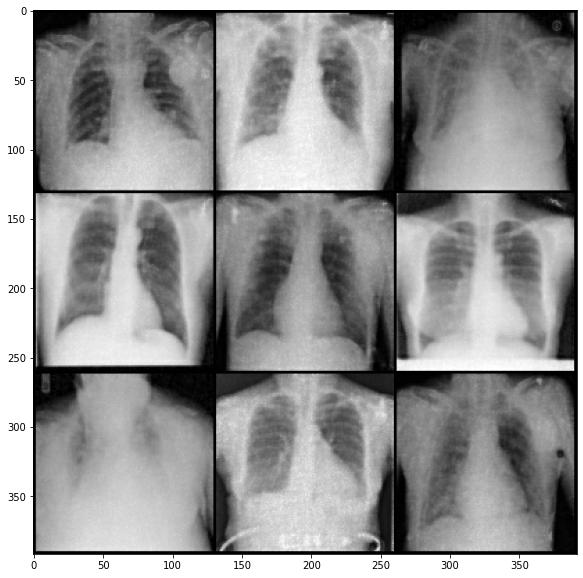

avg_d_loss 0.6921365625039366
avg_g_loss 1.5810792452701965
PSNR:  32.90694139456491
SSIM:  0.8695555925369263


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 34


  0%|          | 0/20 [00:00<?, ?it/s]

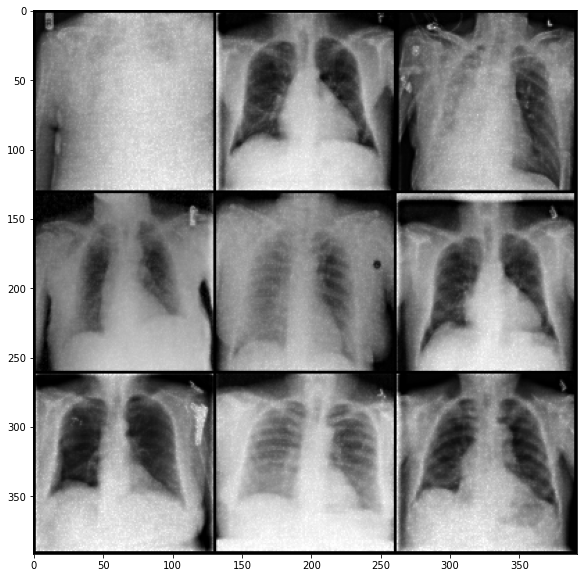

avg_d_loss 0.6916226748155866
avg_g_loss 1.5720240297775268
PSNR:  32.112009049223445
SSIM:  0.8605450391769409


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 35


  0%|          | 0/20 [00:00<?, ?it/s]

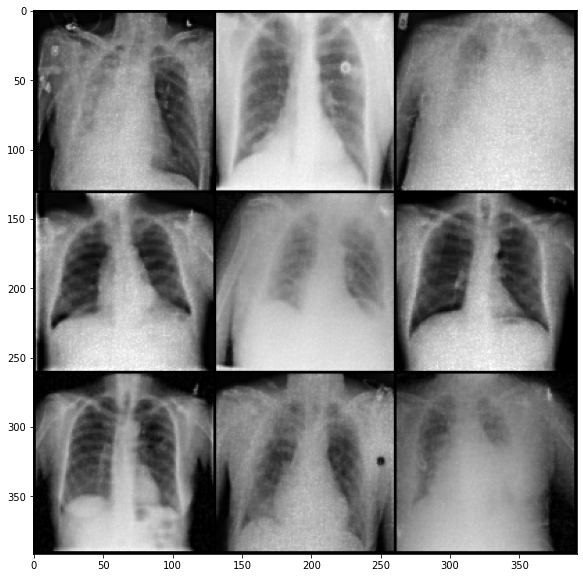

avg_d_loss 0.6914398862488176
avg_g_loss 1.5665222970253532
PSNR:  32.723810626903465
SSIM:  0.8672380447387695


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 36


  0%|          | 0/20 [00:00<?, ?it/s]

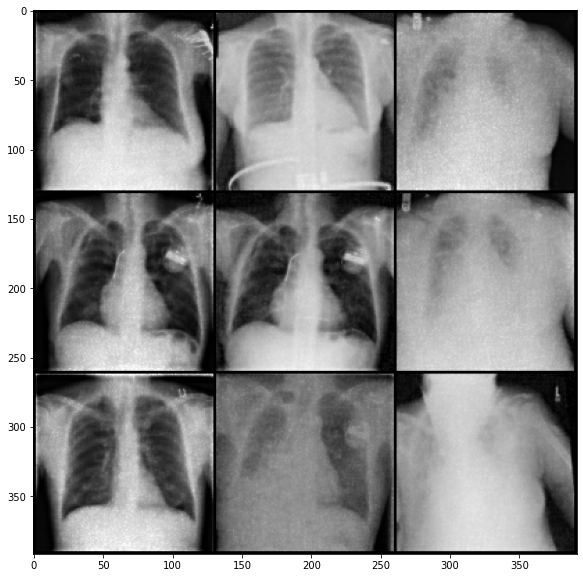

avg_d_loss 0.6916220145931025
avg_g_loss 1.5478140878599205
PSNR:  32.6256147744823
SSIM:  0.879759669303894


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 37


  0%|          | 0/20 [00:00<?, ?it/s]

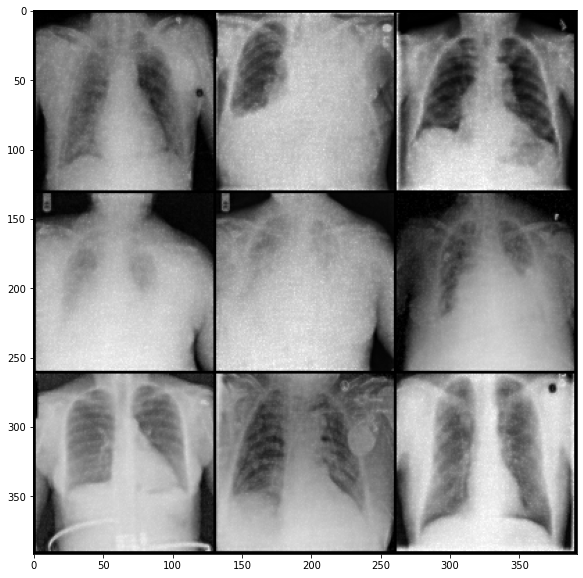

avg_d_loss 0.6899926032360979
avg_g_loss 1.5487173187984316
PSNR:  32.38922776955641
SSIM:  0.8615962862968445


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 38


  0%|          | 0/20 [00:00<?, ?it/s]

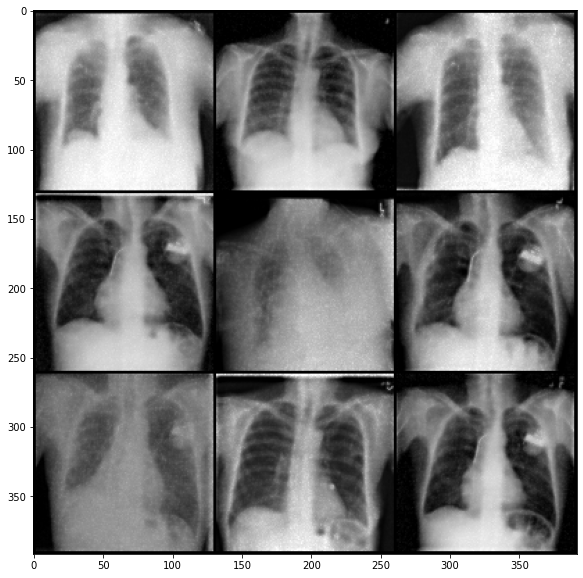

avg_d_loss 0.6908644234866549
avg_g_loss 1.5208736355396761
PSNR:  32.42665691588413
SSIM:  0.8921205401420593


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 39


  0%|          | 0/20 [00:00<?, ?it/s]

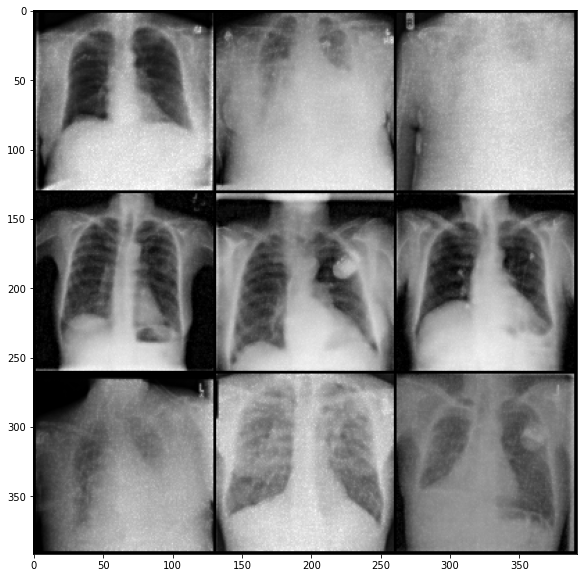

avg_d_loss 0.6886652862742997
avg_g_loss 1.5190161208270871
PSNR:  32.89199587257258
SSIM:  0.8684625625610352


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 40


  0%|          | 0/20 [00:00<?, ?it/s]

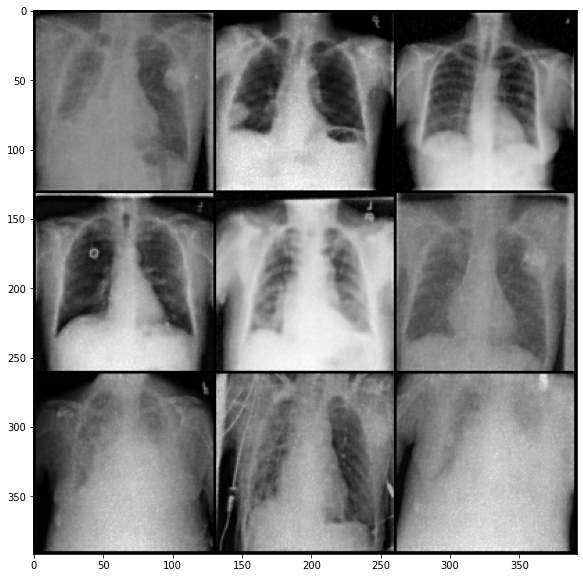

avg_d_loss 0.6886678724949519
avg_g_loss 1.50353549898265
PSNR:  33.1348464463195
SSIM:  0.8777157068252563


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 41


  0%|          | 0/20 [00:00<?, ?it/s]

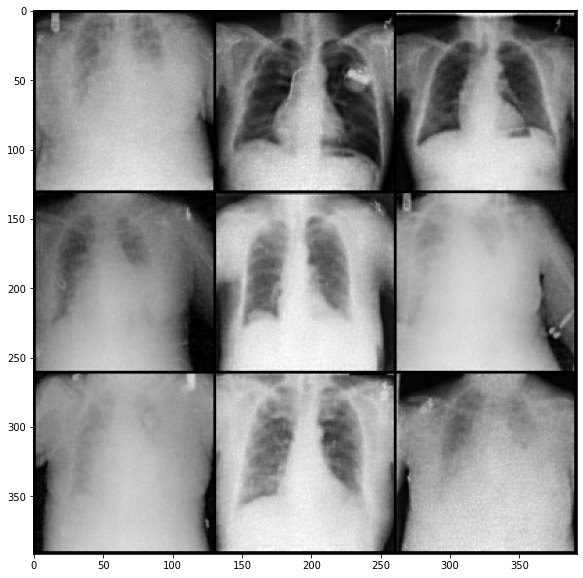

avg_d_loss 0.6875718845118948
avg_g_loss 1.5042383849176977
PSNR:  33.353776181268216
SSIM:  0.8887346386909485


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 42


  0%|          | 0/20 [00:00<?, ?it/s]

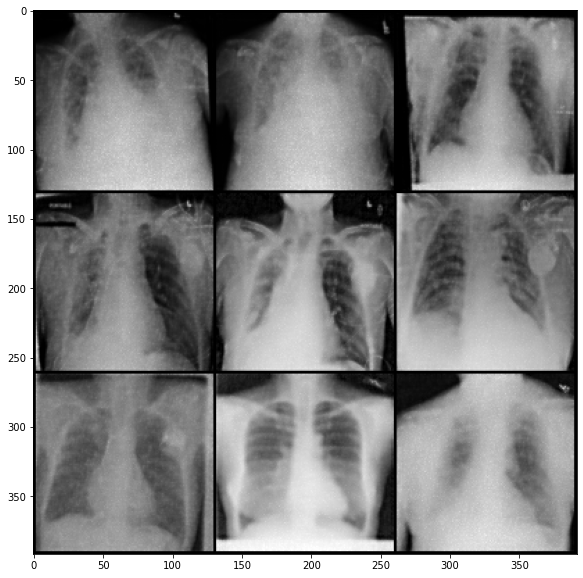

avg_d_loss 0.6872312013310679
avg_g_loss 1.497495059501094
PSNR:  33.114618321001394
SSIM:  0.8681262135505676


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 43


  0%|          | 0/20 [00:00<?, ?it/s]

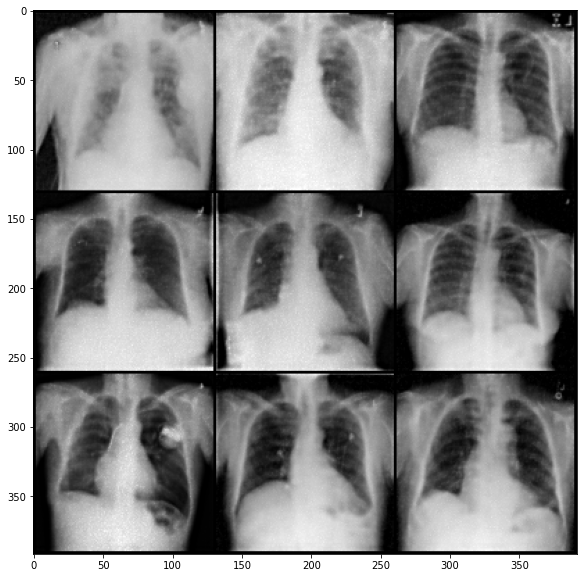

avg_d_loss 0.6863334035840277
avg_g_loss 1.5020811606629727
PSNR:  33.0662850539386
SSIM:  0.8880578875541687


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 44


  0%|          | 0/20 [00:00<?, ?it/s]

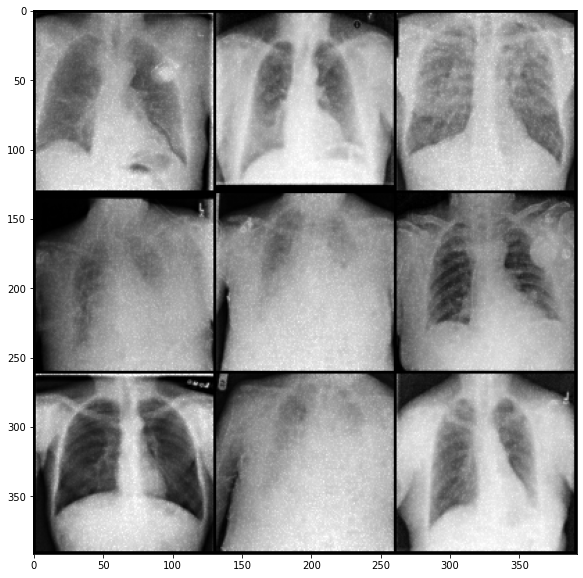

avg_d_loss 0.6853814493117409
avg_g_loss 1.4871998295045972
PSNR:  31.41854591375818
SSIM:  0.8305783271789551


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 45


  0%|          | 0/20 [00:00<?, ?it/s]

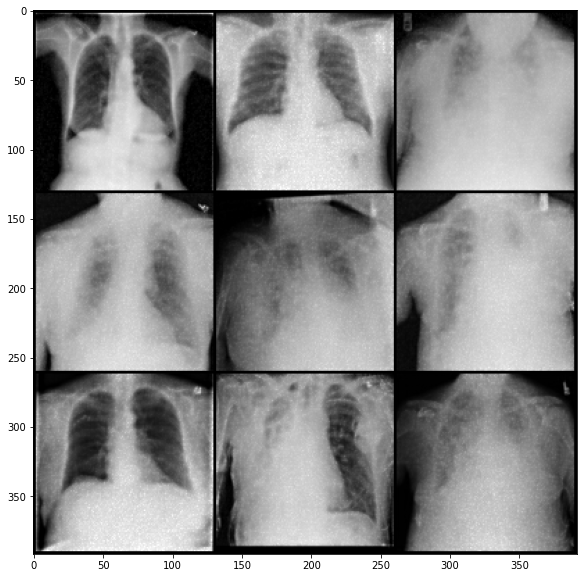

avg_d_loss 0.6844690965297083
avg_g_loss 1.460558630114183
PSNR:  32.81972018141914
SSIM:  0.8640901446342468


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 46


  0%|          | 0/20 [00:00<?, ?it/s]

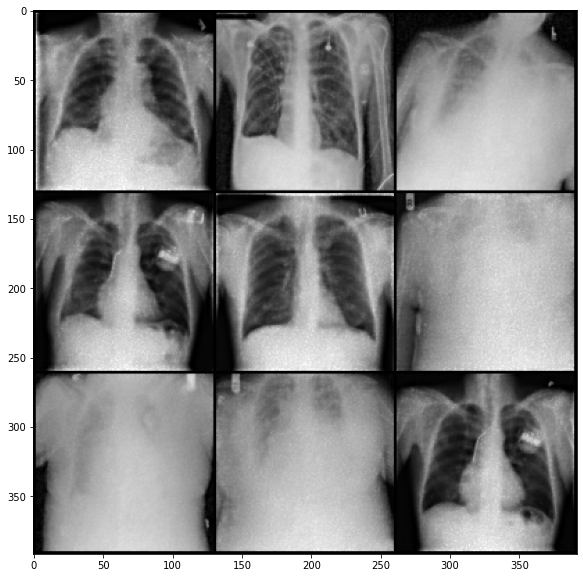

avg_d_loss 0.6825267865566131
avg_g_loss 1.4626255424936396
PSNR:  33.129871343639934
SSIM:  0.8991945385932922


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 47


  0%|          | 0/20 [00:00<?, ?it/s]

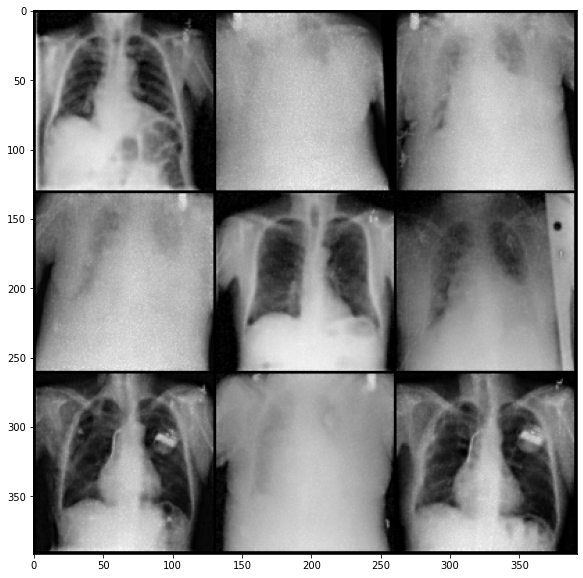

avg_d_loss 0.681078068262641
avg_g_loss 1.4538038380367504
PSNR:  33.66010292767214
SSIM:  0.8920833468437195


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 48


  0%|          | 0/20 [00:00<?, ?it/s]

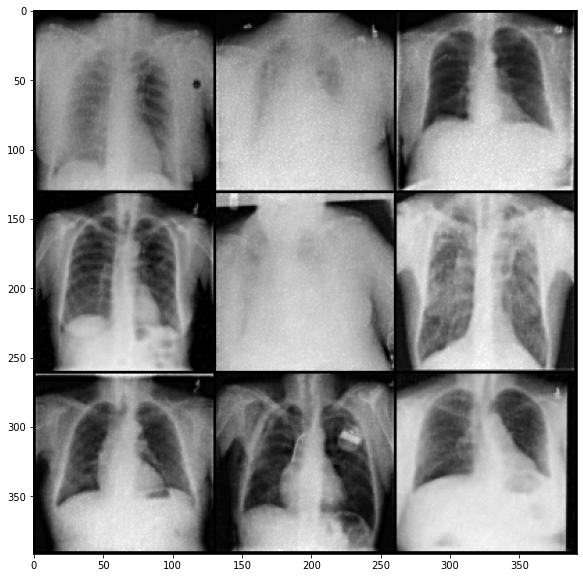

avg_d_loss 0.6814618314787135
avg_g_loss 1.456215811320636
PSNR:  32.82997309528696
SSIM:  0.8811309933662415


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 49


  0%|          | 0/20 [00:00<?, ?it/s]

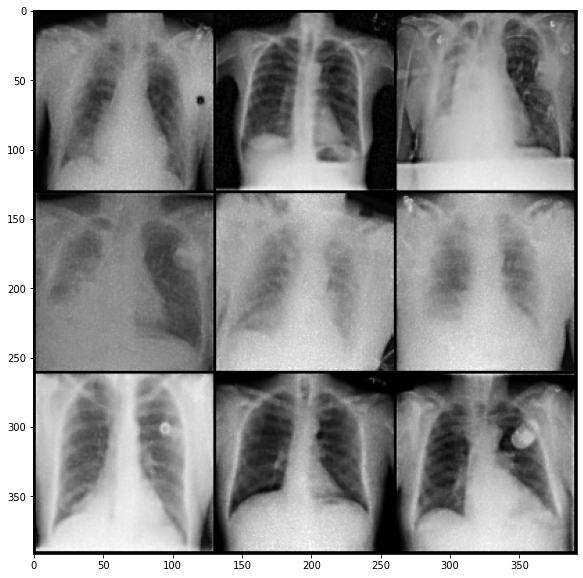

avg_d_loss 0.6789827382016854
avg_g_loss 1.4634401999811104
PSNR:  33.203686756762814
SSIM:  0.8790372014045715


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch Number: 50


  0%|          | 0/20 [00:00<?, ?it/s]

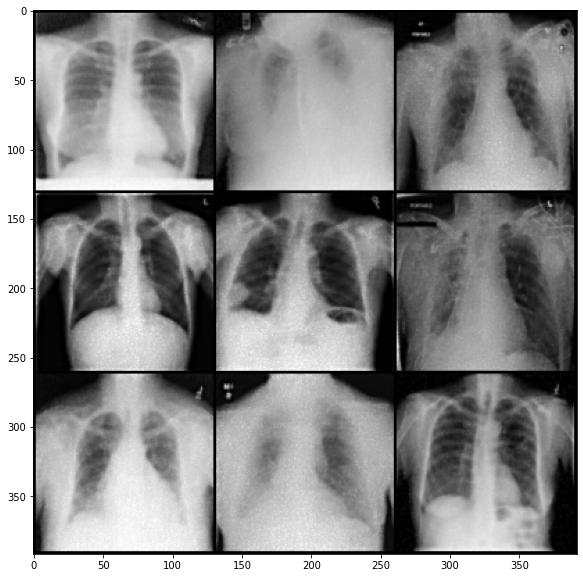

avg_d_loss 0.6794791791166327
avg_g_loss 1.4632887205351806
PSNR:  33.14776514672848
SSIM:  0.8924071192741394


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Training loop

for i in range(epochs):
  it = i+1
  print('Epoch Number:', it)
  total_d_loss = 0.0
  total_g_loss = 0.0
  for images in tqdm(a_loader):
    
    real_image = images[:,0]
    real_image = real_image.to(device)
    noisy_image = images[:,1]
    noisy_image = noisy_image.to(device)

    D_opt.zero_grad()

    fake_image = G(noisy_image) 
    D_fake_image = D(fake_image)
    fake_image_loss = fake_loss(D_fake_image)

    D_real_image = D(real_image) 
    real_image_loss = real_loss(D_real_image)

    D_loss = (real_image_loss + fake_image_loss)/2 
    total_d_loss += D_loss.item()

    D_loss.backward() 
    # this calculate backwards for alllllll involved params. 
    # but the D_opt decides which to update.
    # so the graph for all params including G have been traversed
    # therefore need to create a new graph with all the params from scratch

    D_opt.step()

    #G loss
    G_opt.zero_grad()

    fake_image = G(noisy_image) 
    D_fake_image = D(fake_image)
    G_loss = real_loss(D_fake_image) + 0.01*pixel_loss(real_image, fake_image)
    
    # G_loss = - fake_loss(D_fake_image) 
    
    total_g_loss += G_loss.item()
    G_loss.backward()
    G_opt.step()

  # Display Output
  show_tensor_images(fake_image)

  # Calculating Loss
  avg_d_loss = total_d_loss/len(a_loader)
  avg_g_loss = total_g_loss/len(a_loader)
  print('avg_d_loss', avg_d_loss)
  print('avg_g_loss', avg_g_loss)
  # Calculating PSNR and SSIM
  psn = calculate_batch_psnr(fake_image, real_image)
  ssm = calculate_batch_ssim(fake_image, real_image)
  print('PSNR: ', psn.tolist())
  print("SSIM: ", ssm.tolist())
  
  # Appending losses and evaluations to the list
  iter.append(it)
  psnr.append(psn.tolist())
  ssim.append(ssm.tolist())
  dloss.append(avg_d_loss)
  gloss.append(avg_g_loss)

  # Saving the model
  torch.save({
          'Disc': D.state_dict(),
          'Gen': G.state_dict(),
          'Disc_opt': D_opt.state_dict(),
          'Gen_opt': G_opt.state_dict(),
          }, f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_models_it_{it}.pth')
  files.download(f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_models_it_{it}.pth')

  torch.save(D, f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_disc_it_{it}.pth')
  files.download(f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_disc_it_{it}.pth')

  torch.save(G, f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_gen_it_{it}.pth')
  files.download(f'/content/drive/MyDrive/Denoising_GANs/final/checkpoint_gen_it_{it}.pth')

In [ ]:
iter_psnr["Iterations"] = iter
iter_psnr["PSNR"] = psnr
iter_psnr["D_Loss"] = dloss 
iter_psnr["G_Loss"] = gloss
iter_psnr["SSIM"] = ssim

Text(0.5, 0.98, 'ITERATIONS vs PSNR')

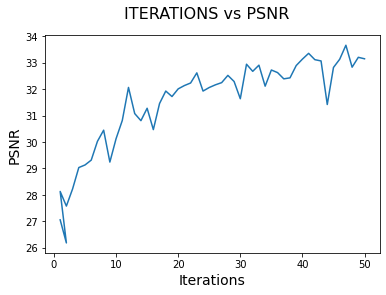

In [ ]:
import matplotlib.pyplot as plt
plt.plot(iter_psnr["Iterations"], iter_psnr["PSNR"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('PSNR', fontsize=14)
plt.suptitle('ITERATIONS vs PSNR', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs SSIM')

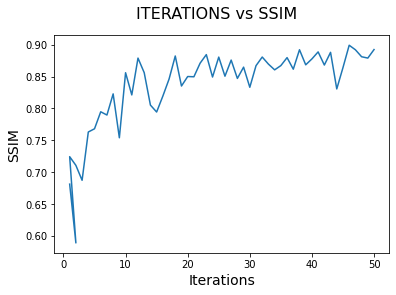

In [ ]:
import matplotlib.pyplot as plt
plt.plot(iter_psnr["Iterations"], iter_psnr["SSIM"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('PSNR', fontsize=14)
plt.suptitle('ITERATIONS vs SSIM', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs D_LOSS')

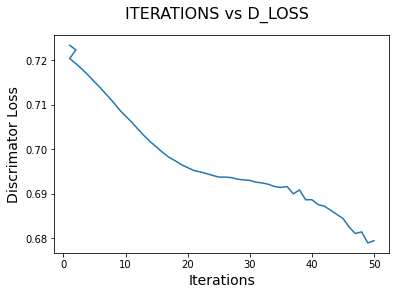

In [ ]:
plt.plot(iter_psnr["Iterations"], iter_psnr["D_Loss"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('Discrimator Loss', fontsize=14)
plt.suptitle('ITERATIONS vs D_LOSS', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs G_Loss')

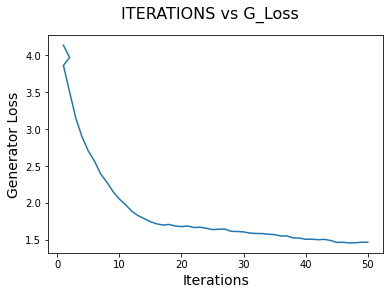

In [ ]:
plt.plot(iter_psnr["Iterations"], iter_psnr["G_Loss"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('Generator Loss', fontsize=14)
plt.suptitle('ITERATIONS vs G_Loss', fontsize=16)